### Dataset

## Tải dataset

In [1]:
!pip install gdown --upgrade
!gdown --id 1etGHXUt557J0a1dF4A1S7E6Fr1LsFQYF
!unzip -q scb_640x320.zip -d ./


  Attempting uninstall: gdown
    Found existing installation: gdown 5.2.0
    Uninstalling gdown-5.2.0:
      Successfully uninstalled gdown-5.2.0
/usr/local/lib/python3.12/dist-packages/gdown/__main__.py:139: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymore to use a file ID.
  warnings.warn(
Downloading...
From (original): https://drive.google.com/uc?id=1etGHXUt557J0a1dF4A1S7E6Fr1LsFQYF
From (redirected): https://drive.google.com/uc?id=1etGHXUt557J0a1dF4A1S7E6Fr1LsFQYF&confirm=t&uuid=865f36b7-fd9e-465b-8c4c-c11782b322a4
To: /kaggle/working/scb_640x320.zip
100%|██████████████████████████████████████| 61.8M/61.8M [00:01<00:00, 52.5MB/s]


## Thống kê minh họa

📊 Dataset summary
----------------------------------------
- train: 450 images
-   val: 79 images
-  test: 142 images
👉 Total unique images: 671

📊 Bounding boxes per class
 Class |   #Boxes |  #Images
--------------------------------
     0 |        6 |        6
     1 |     7826 |      671
     2 |     2984 |      661
     3 |     6976 |      671
     4 |      947 |      452
     5 |     1029 |      601

📌 Total classes: 6
📌 Classes list : [0, 1, 2, 3, 4, 5]

🖼️ Visualize samples per class
----------------------------------------

===== CLASS 0 | showing 3 images =====


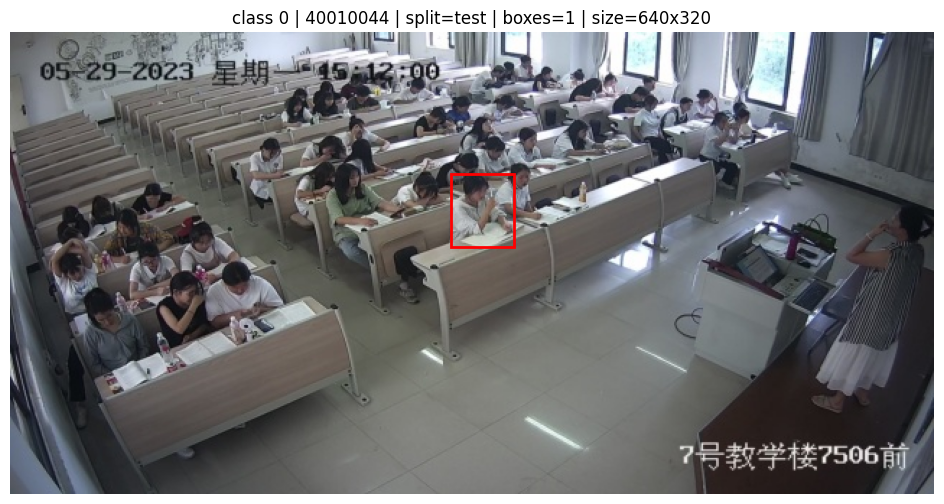

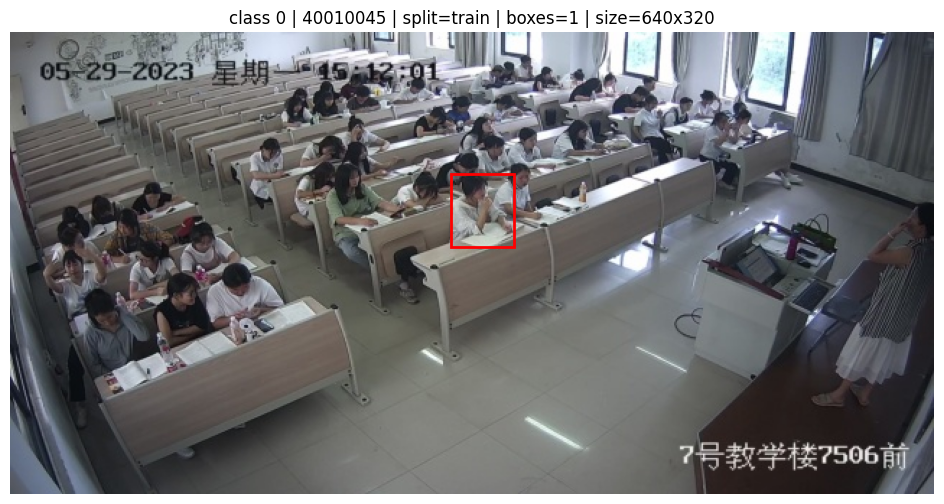

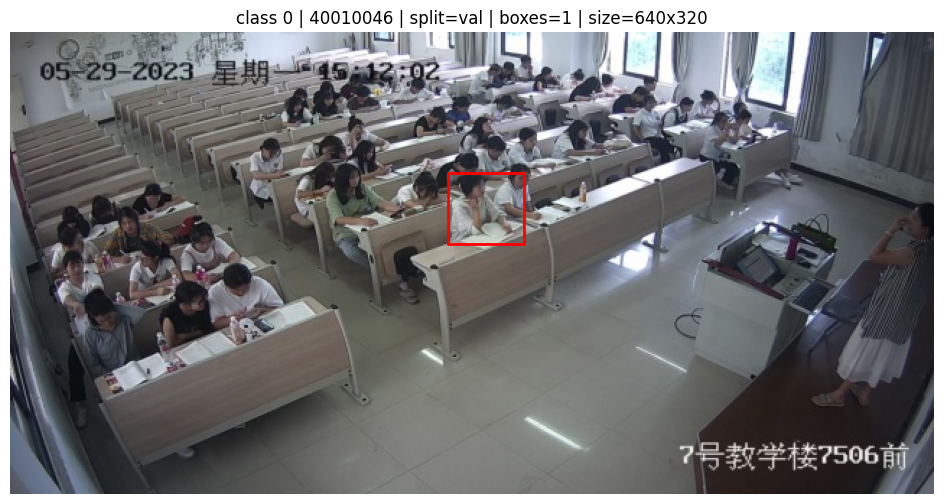


===== CLASS 1 | showing 3 images =====


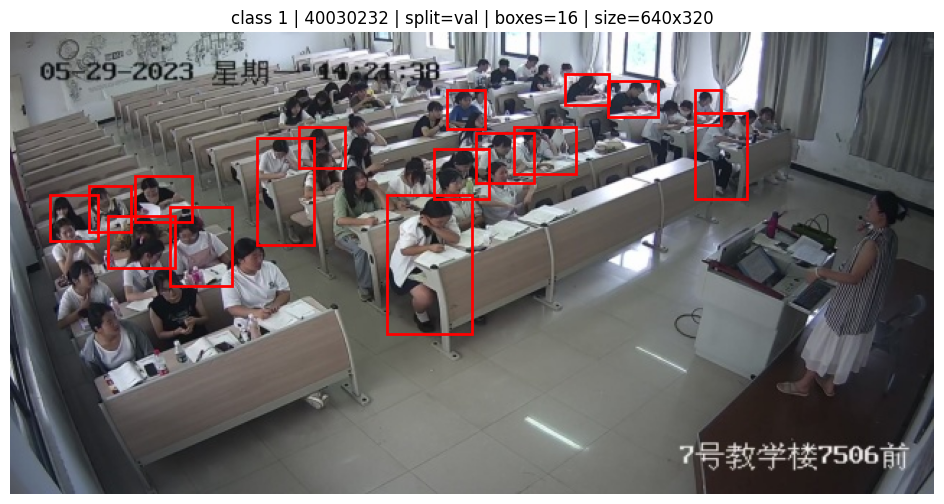

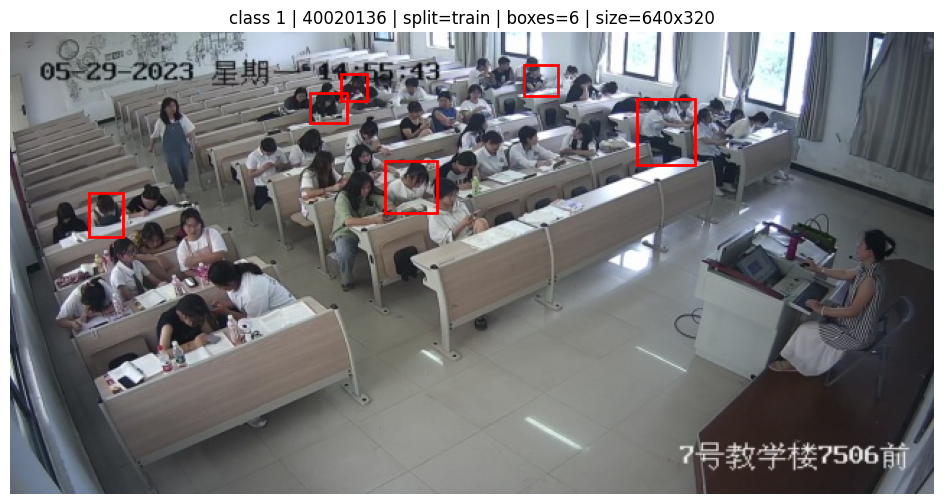

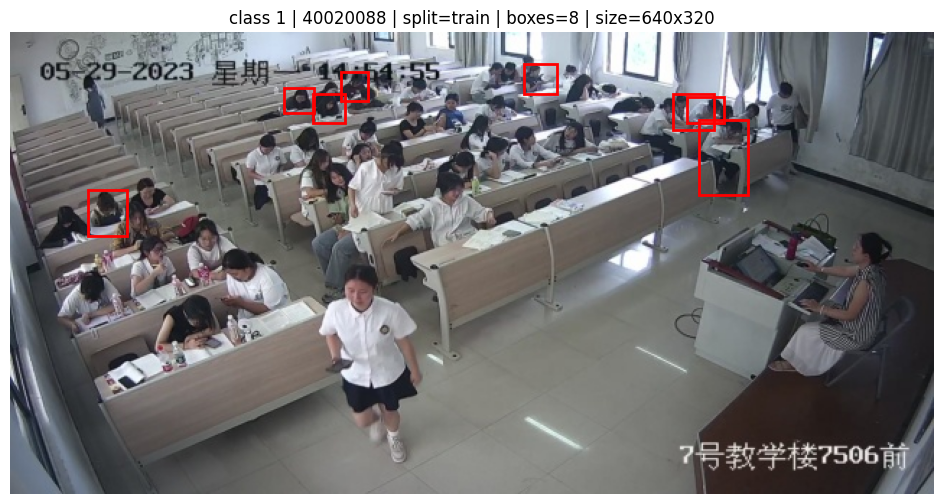


===== CLASS 2 | showing 3 images =====


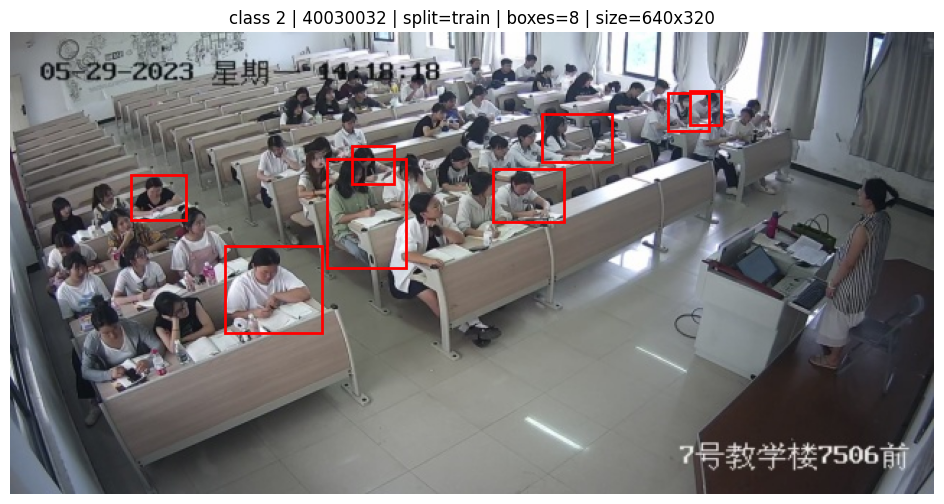

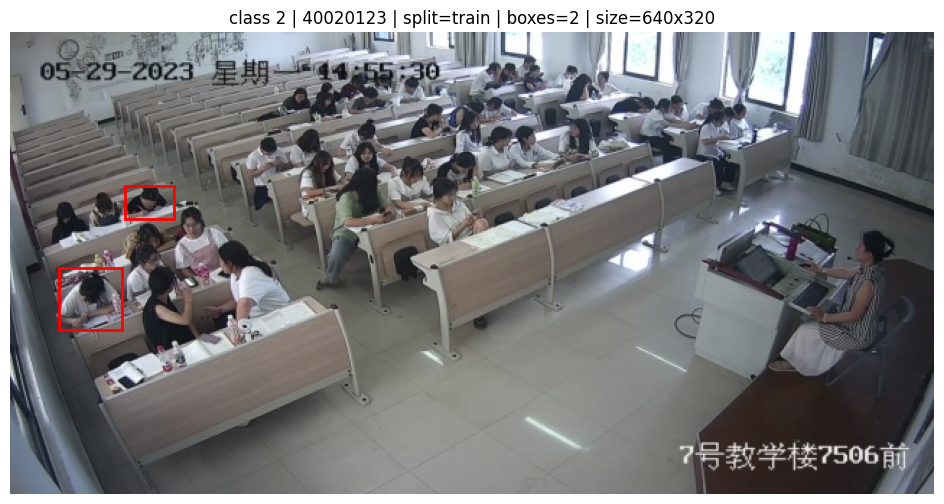

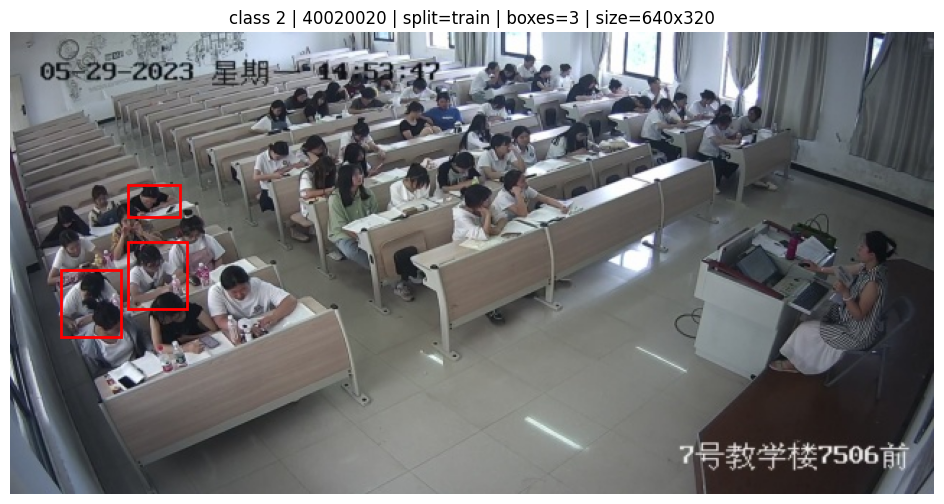


===== CLASS 3 | showing 3 images =====


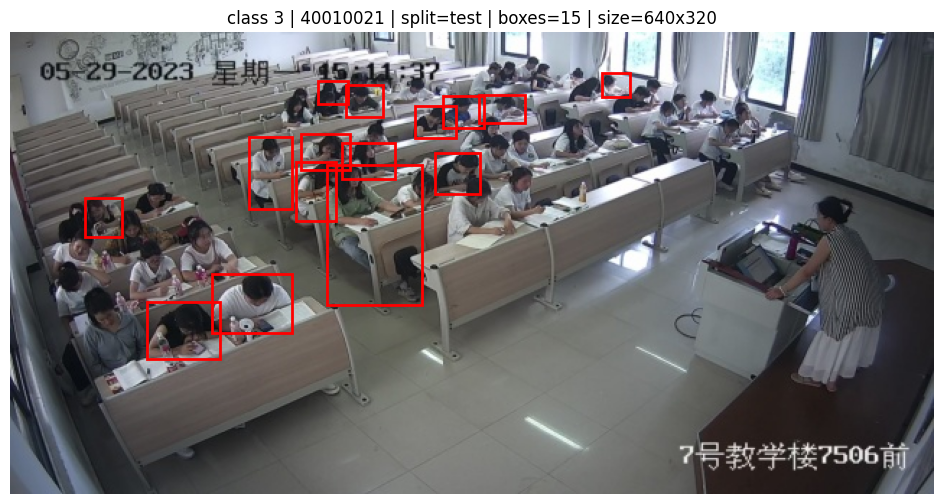

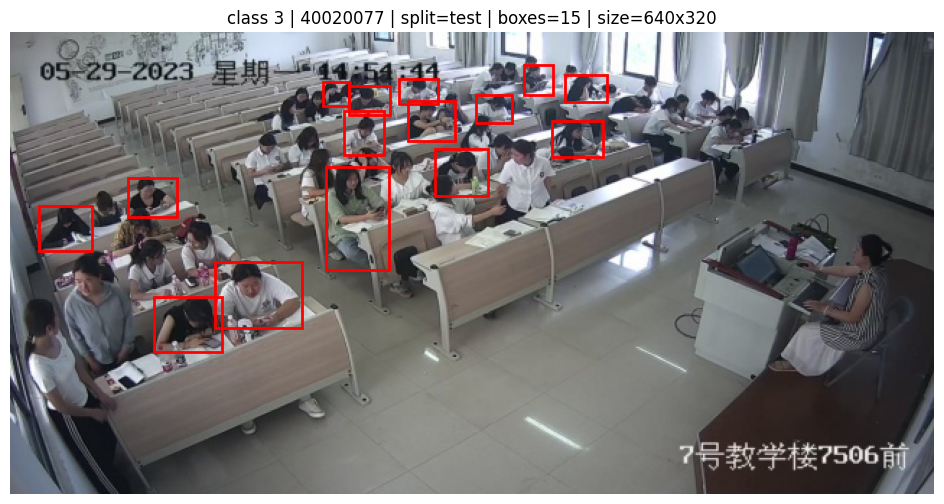

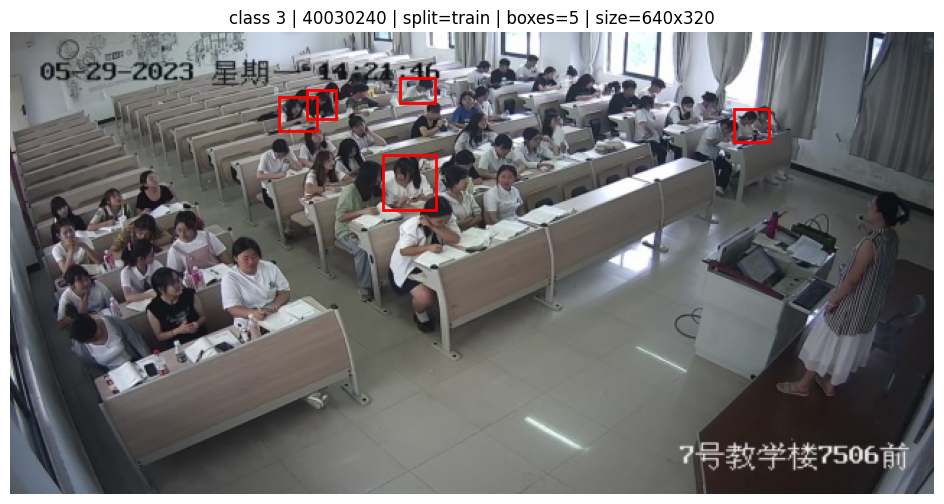


===== CLASS 4 | showing 3 images =====


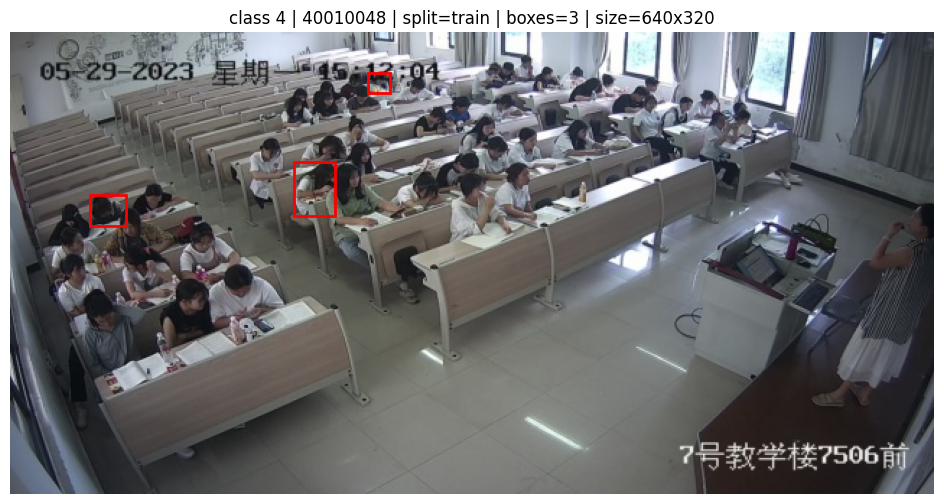

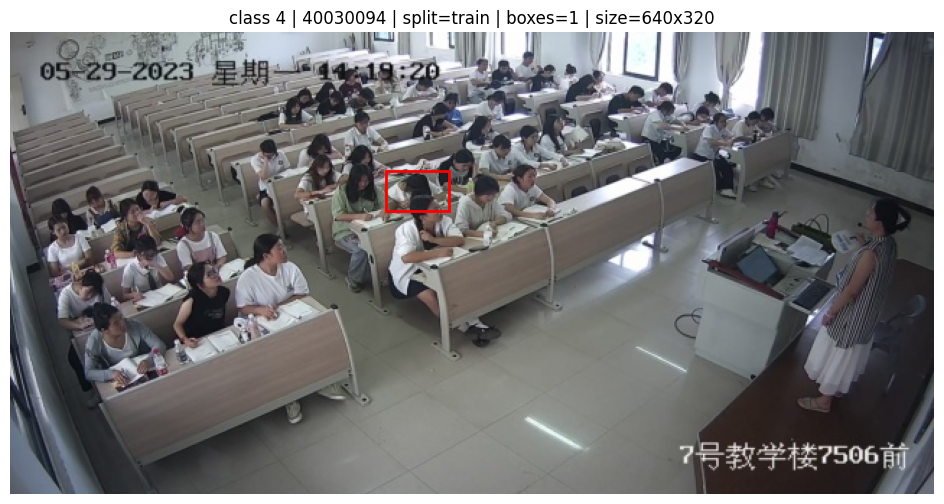

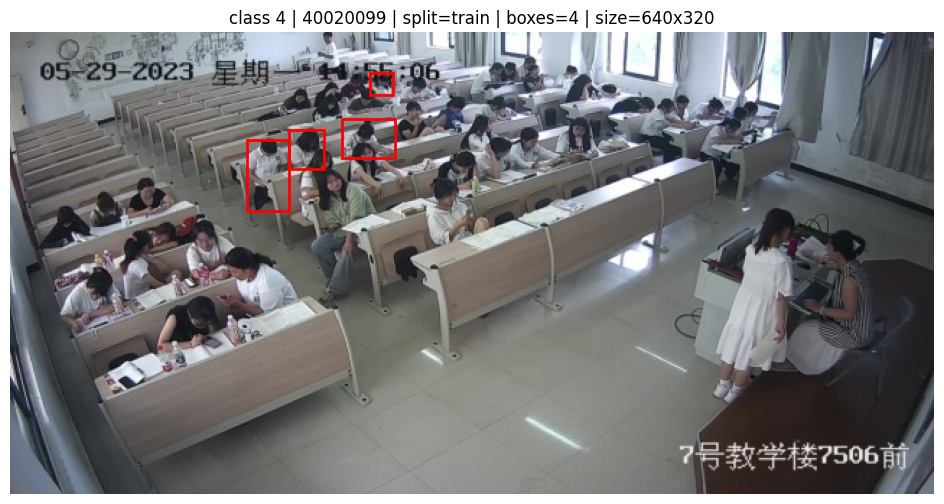


===== CLASS 5 | showing 3 images =====


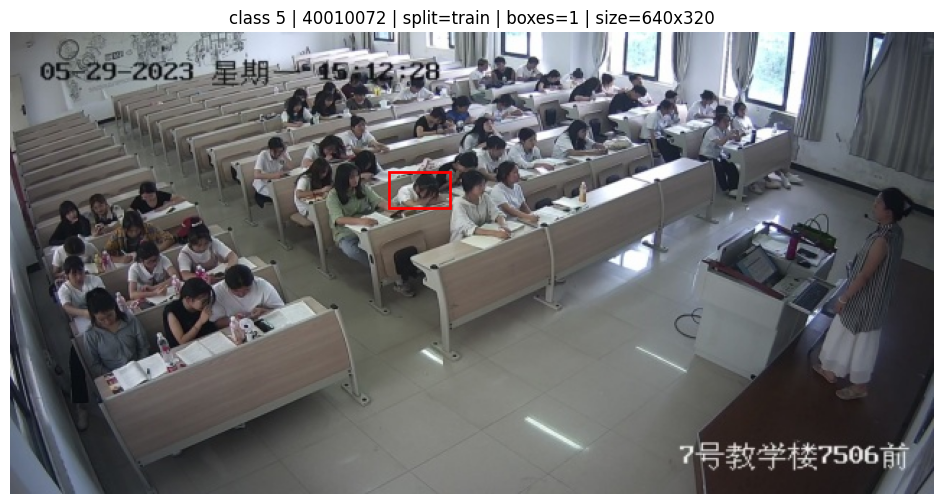

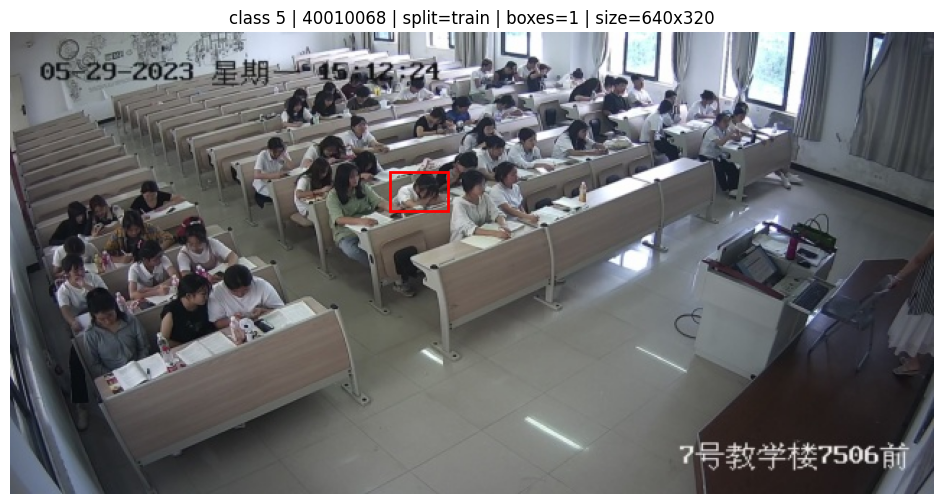

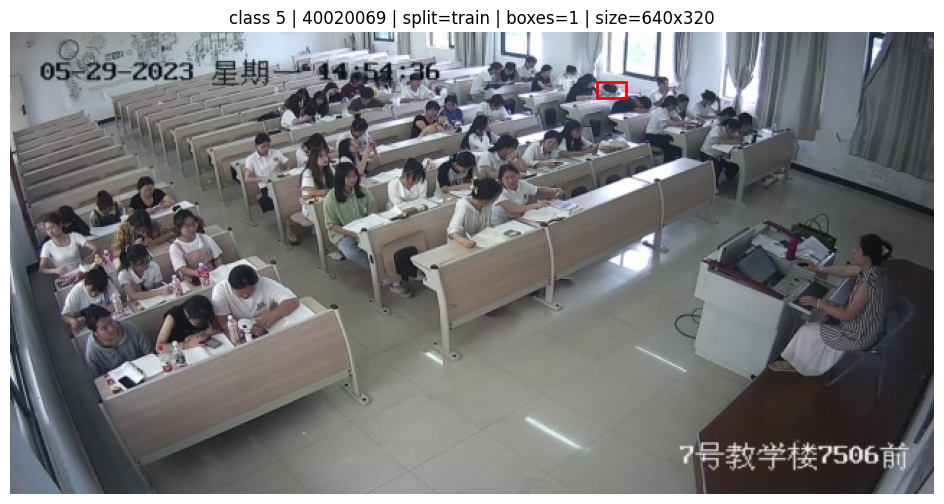

In [3]:
import os, glob, random,  shutil
from collections import defaultdict, Counter
from PIL import Image
import matplotlib.pyplot as plt
import matplotlib.patches as patches

# ===================== CONFIG =====================
ROOT   = "./scb_640x320"
SPLITS = ["train", "val", "test"]
IM_EXTS = [".jpg", ".jpeg", ".png"]

N_SHOW_PER_CLASS = 3   # số ảnh minh họa cho mỗi class
SEED = 42
# ==================================================

random.seed(SEED)

def list_label_files(split):
    lbl_dir = os.path.join(ROOT, "labels", split)
    if not os.path.exists(lbl_dir):
        return []
    return sorted(glob.glob(os.path.join(lbl_dir, "*.txt")))

def find_image_path(split, stem):
    img_dir = os.path.join(ROOT, "images", split)
    for ext in IM_EXTS:
        p = os.path.join(img_dir, stem + ext)
        if os.path.exists(p):
            return p
    return None

def load_yolo_labels(txt_path):
    """
    Return list of (cls, x, y, w, h) from YOLO txt.
    """
    objs = []
    with open(txt_path, "r") as f:
        for line in f:
            parts = line.strip().split()
            if len(parts) != 5:
                continue
            c, x, y, w, h = parts
            objs.append((int(float(c)), float(x), float(y), float(w), float(h)))
    return objs

# ===================== 1) DATASET STATS =====================
images_per_split = defaultdict(set)   # split -> set(stem)
boxes_per_class  = Counter()          # class -> #boxes
images_per_class = defaultdict(set)   # class -> set(stem)
class_to_samples = defaultdict(list)  # class -> list[(split, stem)] for visualization

for sp in SPLITS:
    for lp in list_label_files(sp):
        stem = os.path.splitext(os.path.basename(lp))[0]
        images_per_split[sp].add(stem)

        objs = load_yolo_labels(lp)
        for (cls, x, y, w, h) in objs:
            boxes_per_class[cls] += 1
            images_per_class[cls].add(stem)
            # lưu sample để visualize
            class_to_samples[cls].append((sp, stem))

all_stems = set().union(*images_per_split.values()) if images_per_split else set()

print("📊 Dataset summary")
print("-"*40)
for sp in SPLITS:
    print(f"- {sp:>5}: {len(images_per_split[sp])} images")
print(f"👉 Total unique images: {len(all_stems)}")

print("\n📊 Bounding boxes per class")
print(f"{'Class':>6} | {'#Boxes':>8} | {'#Images':>8}")
print("-"*32)

for cls in sorted(boxes_per_class.keys()):
    n_boxes  = boxes_per_class[cls]
    n_images = len(images_per_class[cls])
    print(f"{cls:>6} | {n_boxes:>8} | {n_images:>8}")

print(f"\n📌 Total classes: {len(boxes_per_class)}")
print(f"📌 Classes list : {sorted(boxes_per_class.keys())}")

# ===================== 2) VISUALIZE SAMPLES =====================
def draw_boxes(ax, img, labels, target_cls=None):
    W, H = img.size
    ax.imshow(img)
    ax.axis("off")

    count = 0
    for (cls, x, y, w, h) in labels:
        if target_cls is not None and cls != target_cls:
            continue

        bw, bh = w * W, h * H
        cx, cy = x * W, y * H
        x1, y1 = cx - bw/2, cy - bh/2

        rect = patches.Rectangle((x1, y1), bw, bh, linewidth=2,
                                 edgecolor="red", facecolor="none")
        ax.add_patch(rect)
        count += 1
    return count

print("\n🖼️ Visualize samples per class")
print("-"*40)

for cls in sorted(class_to_samples.keys()):
    pairs = class_to_samples[cls]
    if len(pairs) == 0:
        continue

    sample = random.sample(pairs, min(N_SHOW_PER_CLASS, len(pairs)))
    print(f"\n===== CLASS {cls} | showing {len(sample)} images =====")

    for sp, stem in sample:
        img_path = find_image_path(sp, stem)
        lbl_path = os.path.join(ROOT, "labels", sp, stem + ".txt")
        if img_path is None or not os.path.exists(lbl_path):
            continue

        img = Image.open(img_path).convert("RGB")
        labels = load_yolo_labels(lbl_path)

        fig, ax = plt.subplots(figsize=(12, 6))
        cnt = draw_boxes(ax, img, labels, target_cls=cls)
        ax.set_title(f"class {cls} | {stem} | split={sp} | boxes={cnt} | size={img.size[0]}x{img.size[1]}")
        plt.show()


# Huấn luyện

In [11]:
!pip -q install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 20.4 MB/s eta 0:00:00a 0:00:01


In [12]:
 

SRC = "./scb_640x320"   # dataset gốc
DST = "./scb_5cls"              # dataset mới 5 class
SPLITS = ["train", "val", "test"]
IMAGE_EXTS = [".jpg", ".jpeg", ".png"]        # để kiểm tra ảnh nếu cần
DROP_EMPTY_LABEL_IMAGES = False               # True nếu muốn xóa ảnh không còn bbox

# Mapping 6 class -> 5 class (loại class 0)
# old: 0=giơ tay, 1=đọc, 2=viết, 3=cúi mặt, 4=đt, 5=tựa đầu/nằm bàn
# new: 0=đọc, 1=viết, 2=cúi mặt, 3=đt, 4=tựa đầu/nằm bàn
MAP_5CLS = {1: 0, 2: 1, 3: 2, 4: 3, 5: 4}
DROP_OLD = {0}  # class bị loại

def remap_cls(old_cls: int):
    """Return new class id (0..4) or None if class should be dropped."""
    if old_cls in DROP_OLD:
        return None
    if old_cls not in MAP_5CLS:
        raise ValueError(f"Found unexpected class id: {old_cls}")
    return MAP_5CLS[old_cls]

def ensure_dirs():
    for sp in SPLITS:
        os.makedirs(os.path.join(DST, "images", sp), exist_ok=True)
        os.makedirs(os.path.join(DST, "labels", sp), exist_ok=True)

def copy_images():
    for sp in SPLITS:
        src_img_dir = os.path.join(SRC, "images", sp)
        dst_img_dir = os.path.join(DST, "images", sp)

        if not os.path.exists(src_img_dir):
            print(f"⚠️ Missing images dir: {src_img_dir}")
            continue

        for p in glob.glob(os.path.join(src_img_dir, "*")):
            if os.path.isfile(p):
                shutil.copy2(p, os.path.join(dst_img_dir, os.path.basename(p)))

def remap_labels():
    stats_boxes = Counter()
    stats_images = Counter()

    for sp in SPLITS:
        src_lbl_dir = os.path.join(SRC, "labels", sp)
        dst_lbl_dir = os.path.join(DST, "labels", sp)

        if not os.path.exists(src_lbl_dir):
            print(f"⚠️ Missing labels dir: {src_lbl_dir}")
            continue

        for lp in glob.glob(os.path.join(src_lbl_dir, "*.txt")):
            stem = os.path.splitext(os.path.basename(lp))[0]
            outp = os.path.join(dst_lbl_dir, os.path.basename(lp))

            new_lines = []
            with open(lp, "r") as f:
                for line in f:
                    line = line.strip()
                    if not line:
                        continue
                    parts = line.split()
                    if len(parts) < 5:
                        continue

                    old = int(float(parts[0]))
                    new = remap_cls(old)

                    # bỏ bbox thuộc class 0 (giơ tay)
                    if new is None:
                        continue

                    # chỉ đổi class id, giữ bbox yolo
                    parts[0] = str(new)
                    new_lines.append(" ".join(parts[:5]))

                    stats_boxes[new] += 1

            # ghi label mới
            with open(outp, "w") as g:
                if new_lines:
                    g.write("\n".join(new_lines) + "\n")
                    stats_images[sp] += 1
                else:
                    # không có bbox hợp lệ sau lọc -> để file rỗng
                    g.write("")

            # (tuỳ chọn) xóa ảnh nếu label rỗng
            if DROP_EMPTY_LABEL_IMAGES and len(new_lines) == 0:
                dst_img_dir = os.path.join(DST, "images", sp)
                removed = False
                for ext in IMAGE_EXTS:
                    ip = os.path.join(dst_img_dir, stem + ext)
                    if os.path.exists(ip):
                        os.remove(ip)
                        removed = True
                        break

    return stats_boxes, stats_images

def summarize(stats_boxes):
    print("\n✅ Done remap ->", DST)
    print("📌 New class mapping (old -> new):", MAP_5CLS)
    print("📌 Dropped old classes:", sorted(list(DROP_OLD)))

    print("\n📊 Boxes per NEW class:")
    for cls in sorted(stats_boxes.keys()):
        print(f"  - Class {cls}: {stats_boxes[cls]} boxes")

    print("\n📌 New class names suggestion:")
    print("  0: đọc")
    print("  1: viết")
    print("  2: cúi mặt xuống")
    print("  3: sử dụng điện thoại")
    print("  4: tựa đầu / nằm trên bàn")

# ========= RUN =========
ensure_dirs()
copy_images()
stats_boxes, stats_images = remap_labels()
summarize(stats_boxes)



✅ Done remap -> ./scb_5cls
📌 New class mapping (old -> new): {1: 0, 2: 1, 3: 2, 4: 3, 5: 4}
📌 Dropped old classes: [0]

📊 Boxes per NEW class:
  - Class 0: 7826 boxes
  - Class 1: 2984 boxes
  - Class 2: 6976 boxes
  - Class 3: 947 boxes
  - Class 4: 1029 boxes

📌 New class names suggestion:
  0: đọc
  1: viết
  2: cúi mặt xuống
  3: sử dụng điện thoại
  4: tựa đầu / nằm trên bàn


In [13]:
yaml = f"""
path: {DST}
train: images/train
val: images/val
test: images/test

names:
  0: doc
  1: viet
  2: cui_mat_xuong
  3: su_dung_dien_thoai
  4: tua_dau_hoac_nam_tren_ban
"""
with open("./scb_5cls.yaml", "w") as f:
    f.write(yaml)

print("✅ Wrote ./scb_5cls.yaml")


✅ Wrote ./scb_5cls.yaml


### Phiên bản Yolo

In [14]:
!yolo detect train model=yolo11n.pt data=./scb_5cls.yaml imgsz=640 epochs=20 batch=32 workers=2 name=train

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
Ultralytics 8.4.9 🚀 Python-3.12.12 torch-2.8.0+cu126 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=32, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=./scb_5cls.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=20, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=F

### Kiểm tra kết quả khi test

In [15]:
import numpy as np
from ultralytics import YOLO

# ====== CONFIG ======
MODEL_PATH = "./runs/detect/train/weights/best.pt"
DATA_YAML  = "./scb_5cls.yaml"
IMGSZ      = 640
CONF       = 0.35
IOU_THRES  = 0.50
# ====================

model = YOLO(MODEL_PATH)

def safe_float(x):
    """Convert scalar/array to float safely (take mean if array)."""
    if x is None:
        return 0.0
    if isinstance(x, (list, tuple)):
        x = np.array(x)
    if hasattr(x, "shape") and x.shape != ():   # numpy array (non-scalar)
        return float(np.mean(x))
    return float(x)

def safe_f1(p, r):
    return (2*p*r/(p+r)) if (p+r) > 0 else 0.0

def run_split(split_name: str):
    metrics = model.val(
        data=DATA_YAML,
        split=split_name,      # "val" hoặc "test"
        imgsz=IMGSZ,
        conf=CONF,
        iou=IOU_THRES,
        plots=False,
        verbose=False
    )

    # Prefer mean metrics if available (Ultralytics thường có mp/mr)
    # - mp: mean precision
    # - mr: mean recall
    p = safe_float(getattr(metrics.box, "mp", None))
    r = safe_float(getattr(metrics.box, "mr", None))

    # Fallback nếu mp/mr không có (hiếm): lấy mean per-class
    if p == 0.0 and hasattr(metrics.box, "p"):
        p = safe_float(metrics.box.p)
    if r == 0.0 and hasattr(metrics.box, "r"):
        r = safe_float(metrics.box.r)

    f1 = safe_f1(p, r)

    # Coverage theo định nghĩa báo cáo của bạn (tỉ lệ hành vi hợp lệ được phát hiện)
    # Với detection, tương đương Recall tại IoU>=0.5
    coverage = r

    # speed (ms/img)
    speed = getattr(metrics, "speed", {}) or {}
    t_pre  = safe_float(speed.get("preprocess", 0.0))
    t_inf  = safe_float(speed.get("inference", 0.0))
    t_post = safe_float(speed.get("postprocess", 0.0))
    t_total = t_pre + t_inf + t_post

    # mAP (tùy bạn có đưa vào report hay không)
    map50   = safe_float(getattr(metrics.box, "map50", 0.0))
    map5095 = safe_float(getattr(metrics.box, "map", 0.0))

    return {
        "split": split_name,
        "precision": p,
        "recall": r,
        "f1": f1,
        "coverage": coverage,
        "t_infer_ms": t_inf,
        "t_total_ms": t_total,
        "map50": map50,
        "map5095": map5095
    }

def pretty_print(res):
    print(f"\n=== EVALUATION ON {res['split'].upper()} (IoU>={IOU_THRES}, conf={CONF}) ===")
    print(f"Precision         : {res['precision']:.4f}")
    print(f"Recall            : {res['recall']:.4f}")
    print(f"F1-score          : {res['f1']:.4f}")
    print(f"Coverage (=Recall): {res['coverage']:.4f}")
    print(f"mAP@0.5           : {res['map50']:.4f}")
    print(f"mAP@0.5:0.95      : {res['map5095']:.4f}")
    print(f"Time/Img (infer)  : {res['t_infer_ms']:.2f} ms")
    print(f"Time/Img (total)  : {res['t_total_ms']:.2f} ms")
    print(f"Time/Img (total)  : {res['t_total_ms']/1000:.4f} seconds")

# Run both splits
res_val  = run_split("val")
res_test = run_split("test")

pretty_print(res_val)
pretty_print(res_test)

# Report-style summary table
print("\n📌 SUMMARY TABLE (for report)")
print(f"{'Split':<6} | {'P':>6} | {'R':>6} | {'F1':>6} | {'Cov':>6} | {'Infer(ms)':>10} | {'Total(ms)':>10}")
print("-"*72)
for r in [res_val, res_test]:
    print(f"{r['split']:<6} | {r['precision']:>6.3f} | {r['recall']:>6.3f} | {r['f1']:>6.3f} | {r['coverage']:>6.3f} | {r['t_infer_ms']:>10.2f} | {r['t_total_ms']:>10.2f}")


Ultralytics 8.4.9 🚀 Python-3.12.12 torch-2.8.0+cu126 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
YOLO11n summary (fused): 101 layers, 2,583,127 parameters, 0 gradients, 6.3 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 2516.4±605.2 MB/s, size: 88.4 KB)
val: Scanning /kaggle/working/scb_5cls/labels/val.cache... 79 images, 0 backgrounds, 1 corrupt: 100% ━━━━━━━━━━━━ 79/79 13.8Mit/s 0.0s
val: /kaggle/working/scb_5cls/images/val/40010061.jpg: ignoring corrupt image/label: negative class labels or coordinate [  -0.037017]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 5/5 10.2it/s 0.5s.3s
                   all         78       2257      0.755      0.665      0.745      0.591
Speed: 0.4ms preprocess, 2.5ms inference, 0.0ms loss, 0.7ms postprocess per image
Ultralytics 8.4.9 🚀 Python-3.12.12 torch-2.8.0+cu126 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 2273.2±570.2 MB/s, size: 89

🖼️ Selected image: ./scb_5cls/images/test/40020046.jpg


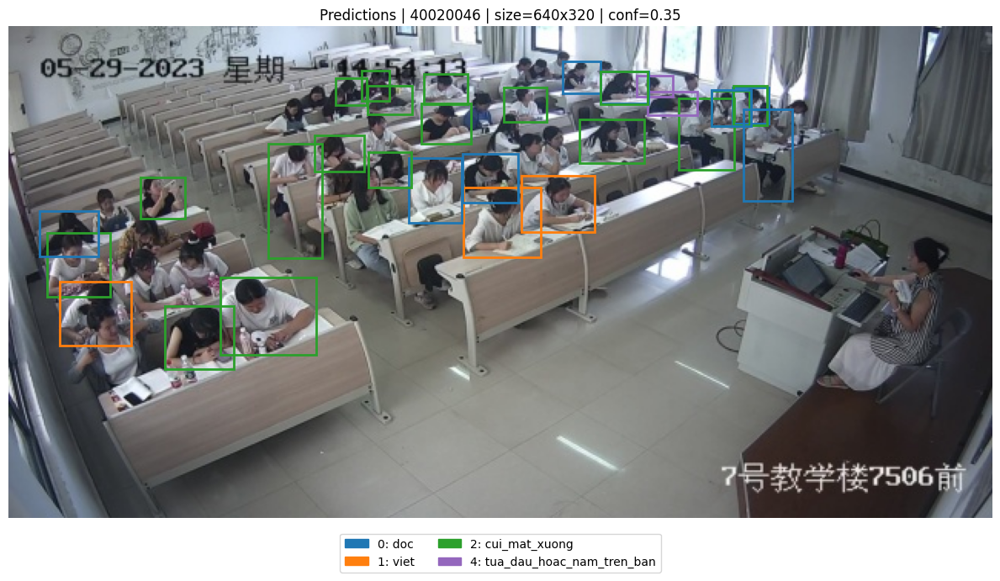

✅ Behaviors present in this image:
  - 0: doc
  - 1: viet
  - 2: cui_mat_xuong
  - 4: tua_dau_hoac_nam_tren_ban


In [16]:
# ===== CONFIG =====
MODEL_PATH = "./runs/detect/train/weights/best.pt"
TEST_DIR   = "./scb_5cls/images/test"
LABEL_DIR  = "./scb_5cls/labels/test"   # GT labels (optional)
IMGSZ      = 640
CONF       = 0.35
IOU        = 0.50
SEED       = 42

SHOW_GT    = False   # True nếu muốn vẽ luôn ground-truth để đối chiếu
# ==================

# 5-class mapping (new ids)
CLASS_NAMES = {
    0: "doc",
    1: "viet",
    2: "cui_mat_xuong",
    3: "su_dung_dien_thoai",
    4: "tua_dau_hoac_nam_tren_ban",
}

# Màu cho từng class 
CLASS_COLORS = {
    0: "#1f77b4",  # blue
    1: "#ff7f0e",  # orange
    2: "#2ca02c",  # green
    3: "#d62728",  # red
    4: "#9467bd",  # purple
}

random.seed(SEED)

# Pick 1 random test image
img_paths = []
for ext in ["*.jpg", "*.jpeg", "*.png"]:
    img_paths += glob.glob(os.path.join(TEST_DIR, ext))

assert len(img_paths) > 0, f"No images found in {TEST_DIR}"
img_path = random.choice(img_paths)
stem = os.path.splitext(os.path.basename(img_path))[0]
gt_path = os.path.join(LABEL_DIR, stem + ".txt")

print("🖼️ Selected image:", img_path)

# Load model & predict
model = YOLO(MODEL_PATH)
pred = model.predict(source=img_path, imgsz=IMGSZ, conf=CONF, iou=IOU, verbose=False)[0]

# Load image
img = Image.open(img_path).convert("RGB")
W, H = img.size

# Prepare figure
fig, ax = plt.subplots(figsize=(12, 7))
ax.imshow(img)
ax.axis("off")
ax.set_title(f"Predictions | {stem} | size={W}x{H} | conf={CONF}")

# Draw predicted boxes (no text on image)
present_classes = set()

if pred.boxes is not None and len(pred.boxes) > 0:
    boxes_xyxy = pred.boxes.xyxy.cpu().numpy()
    cls_ids    = pred.boxes.cls.cpu().numpy().astype(int)
    confs      = pred.boxes.conf.cpu().numpy()

    for (x1, y1, x2, y2), c, cf in zip(boxes_xyxy, cls_ids, confs):
        color = CLASS_COLORS.get(c, "#000000")
        rect = patches.Rectangle(
            (x1, y1), (x2 - x1), (y2 - y1),
            linewidth=2, edgecolor=color, facecolor="none"
        )
        ax.add_patch(rect)
        present_classes.add(c)

# Optional: draw GT boxes with dashed lines
if SHOW_GT and os.path.exists(gt_path):
    with open(gt_path, "r") as f:
        for line in f:
            parts = line.strip().split()
            if len(parts) != 5:
                continue
            c = int(float(parts[0]))
            x, y, w, h = map(float, parts[1:])
            # yolo normalized -> pixel
            bw, bh = w * W, h * H
            cx, cy = x * W, y * H
            x1, y1 = cx - bw/2, cy - bh/2
            color = CLASS_COLORS.get(c, "#000000")
            rect = patches.Rectangle(
                (x1, y1), bw, bh,
                linewidth=2, edgecolor=color, facecolor="none", linestyle="--"
            )
            ax.add_patch(rect)
            present_classes.add(c)

# Legend below (only classes that appear)
handles = []
labels = []
for c in sorted(present_classes):
    color = CLASS_COLORS.get(c, "#000000")
    name = CLASS_NAMES.get(c, f"class_{c}")
    patch = patches.Patch(color=color, label=f"{c}: {name}")
    handles.append(patch)
    labels.append(f"{c}: {name}")

if len(handles) == 0:
    # no detection
    ax.text(10, 30, "No detections", fontsize=14)

# Put legend below the image (outside axes)
fig.legend(handles=handles, loc="lower center", ncol=2, frameon=True, bbox_to_anchor=(0.5, -0.02))
plt.tight_layout()
plt.show()

# Print summary of behaviors present
if present_classes:
    print("✅ Behaviors present in this image:")
    for c in sorted(present_classes):
        print(f"  - {c}: {CLASS_NAMES.get(c, str(c))}")
else:
    print("⚠️ No predicted behaviors found at current conf threshold.")


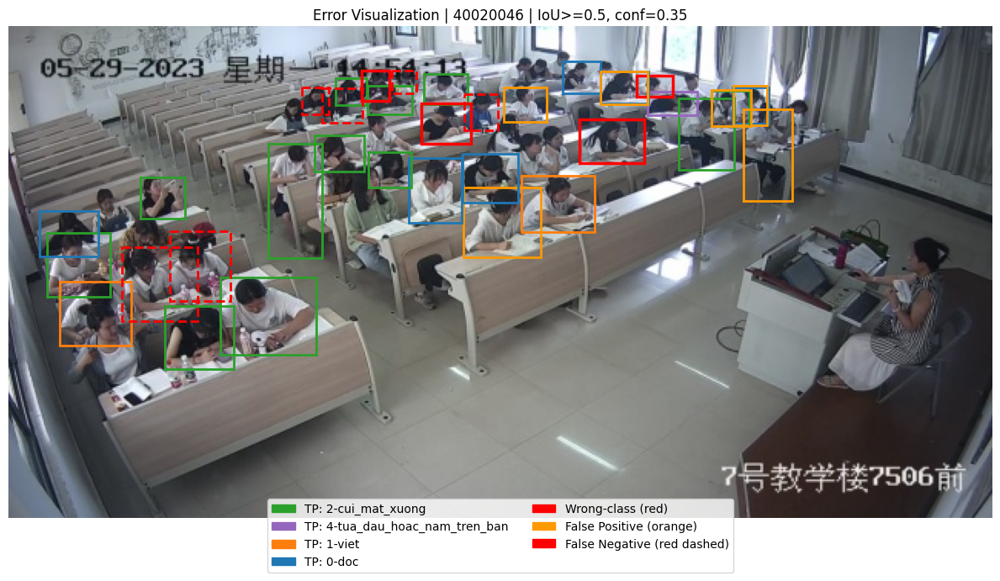

✅ Saved: ./demo_errors.png
🖼️ Image used: ./scb_5cls/images/test/40020046.jpg


In [17]:
# ===== CONFIG =====
MODEL_PATH = "./runs/detect/train/weights/best.pt"
IMG_DIR    = "./scb_5cls/images/test"
LBL_DIR    = "./scb_5cls/labels/test"
OUT_PATH   = "./demo_errors.png"

IMGSZ = 640
CONF  = 0.35
IOU_T = 0.50
SEED  = 42

# 5-class mapping
CLASS_NAMES = {
    0: "doc",
    1: "viet",
    2: "cui_mat_xuong",
    3: "su_dung_dien_thoai",
    4: "tua_dau_hoac_nam_tren_ban",
}
CLASS_COLORS = {
    0: "#1f77b4",  # blue
    1: "#ff7f0e",  # orange
    2: "#2ca02c",  # green
    3: "#d62728",  # red
    4: "#9467bd",  # purple
}

# Error colors
COLOR_WRONGCLASS = "#ff0000"  # red
COLOR_FP         = "#ff9900"  # orange-ish
COLOR_FN         = "#ff0000"  # red (dashed)

random.seed(SEED)
np.random.seed(SEED)

def yolo_to_xyxy(x, y, w, h, W, H):
    bw, bh = w * W, h * H
    cx, cy = x * W, y * H
    x1, y1 = cx - bw/2, cy - bh/2
    x2, y2 = cx + bw/2, cy + bh/2
    return np.array([x1, y1, x2, y2], dtype=float)

def iou_xyxy(a, b):
    # a,b: [x1,y1,x2,y2]
    x1 = max(a[0], b[0]); y1 = max(a[1], b[1])
    x2 = min(a[2], b[2]); y2 = min(a[3], b[3])
    inter = max(0, x2-x1) * max(0, y2-y1)
    area_a = max(0, a[2]-a[0]) * max(0, a[3]-a[1])
    area_b = max(0, b[2]-b[0]) * max(0, b[3]-b[1])
    union = area_a + area_b - inter + 1e-9
    return inter / union

def load_gt(lbl_path, W, H):
    gts = []
    if not os.path.exists(lbl_path):
        return gts
    with open(lbl_path, "r") as f:
        for line in f:
            p = line.strip().split()
            if len(p) != 5:
                continue
            c = int(float(p[0]))
            x, y, w, h = map(float, p[1:])
            gts.append({"cls": c, "box": yolo_to_xyxy(x,y,w,h,W,H)})
    return gts

def pick_image_with_errors(model, img_paths, max_try=50):
    # cố tìm ảnh có ít nhất 1 FP/FN/wrong-class để demo cho "đẹp"
    for _ in range(max_try):
        img_path = random.choice(img_paths)
        stem = os.path.splitext(os.path.basename(img_path))[0]
        lbl_path = os.path.join(LBL_DIR, stem + ".txt")

        img = Image.open(img_path).convert("RGB")
        W, H = img.size
        gts = load_gt(lbl_path, W, H)

        pred = model.predict(source=img_path, imgsz=IMGSZ, conf=CONF, iou=IOU_T, verbose=False)[0]
        if pred.boxes is None or len(pred.boxes) == 0:
            if len(gts) > 0:
                return img_path  # toàn FN cũng là 1 kiểu lỗi
            continue

        p_boxes = pred.boxes.xyxy.cpu().numpy()
        p_cls   = pred.boxes.cls.cpu().numpy().astype(int)

        # match greedy theo IoU
        used_gt = set()
        wrong, fp, fn = 0, 0, 0

        for i in range(len(p_boxes)):
            best_j, best_iou = -1, 0.0
            for j, gt in enumerate(gts):
                if j in used_gt:
                    continue
                v = iou_xyxy(p_boxes[i], gt["box"])
                if v > best_iou:
                    best_iou, best_j = v, j
            if best_iou >= IOU_T and best_j >= 0:
                used_gt.add(best_j)
                if p_cls[i] != gts[best_j]["cls"]:
                    wrong += 1
            else:
                fp += 1

        fn = len(gts) - len(used_gt)

        if (wrong + fp + fn) > 0:
            return img_path

    return random.choice(img_paths)

def visualize_errors_one_image():
    model = YOLO(MODEL_PATH)

    img_paths = []
    for ext in ["*.jpg", "*.jpeg", "*.png"]:
        img_paths += glob.glob(os.path.join(IMG_DIR, ext))
    assert len(img_paths) > 0, "No images found."

    img_path = pick_image_with_errors(model, img_paths)
    stem = os.path.splitext(os.path.basename(img_path))[0]
    lbl_path = os.path.join(LBL_DIR, stem + ".txt")

    img = Image.open(img_path).convert("RGB")
    W, H = img.size
    gts = load_gt(lbl_path, W, H)

    pred = model.predict(source=img_path, imgsz=IMGSZ, conf=CONF, iou=IOU_T, verbose=False)[0]

    # prepare matches
    p_boxes = np.zeros((0,4))
    p_cls   = np.zeros((0,), dtype=int)
    if pred.boxes is not None and len(pred.boxes) > 0:
        p_boxes = pred.boxes.xyxy.cpu().numpy()
        p_cls   = pred.boxes.cls.cpu().numpy().astype(int)

    used_gt = set()
    pred_status = []  # (i, status, matched_gt_idx)
    # status: "TP", "WRONG", "FP"
    for i in range(len(p_boxes)):
        best_j, best_iou = -1, 0.0
        for j, gt in enumerate(gts):
            if j in used_gt:
                continue
            v = iou_xyxy(p_boxes[i], gt["box"])
            if v > best_iou:
                best_iou, best_j = v, j

        if best_iou >= IOU_T and best_j >= 0:
            used_gt.add(best_j)
            if p_cls[i] == gts[best_j]["cls"]:
                pred_status.append((i, "TP", best_j))
            else:
                pred_status.append((i, "WRONG", best_j))
        else:
            pred_status.append((i, "FP", -1))

    fn_indices = [j for j in range(len(gts)) if j not in used_gt]

    # plot
    fig, ax = plt.subplots(figsize=(12, 7))
    ax.imshow(img)
    ax.axis("off")
    ax.set_title(f"Error Visualization | {stem} | IoU>={IOU_T}, conf={CONF}")

    present_legend = {}

    # draw predictions
    for i, status, j in pred_status:
        x1,y1,x2,y2 = p_boxes[i]
        if status == "TP":
            c = int(p_cls[i])
            col = CLASS_COLORS.get(c, "#00ff00")
            rect = patches.Rectangle((x1,y1), x2-x1, y2-y1, linewidth=2, edgecolor=col, facecolor="none")
            ax.add_patch(rect)
            present_legend[f"TP: {c}-{CLASS_NAMES.get(c,str(c))}"] = col

        elif status == "WRONG":
            rect = patches.Rectangle((x1,y1), x2-x1, y2-y1, linewidth=2.5, edgecolor=COLOR_WRONGCLASS, facecolor="none")
            ax.add_patch(rect)
            present_legend["Wrong-class (red)"] = COLOR_WRONGCLASS

        elif status == "FP":
            rect = patches.Rectangle((x1,y1), x2-x1, y2-y1, linewidth=2, edgecolor=COLOR_FP, facecolor="none")
            ax.add_patch(rect)
            present_legend["False Positive (orange)"] = COLOR_FP

    # draw FNs (GT missed): dashed red
    for j in fn_indices:
        x1,y1,x2,y2 = gts[j]["box"]
        rect = patches.Rectangle((x1,y1), x2-x1, y2-y1, linewidth=2, edgecolor=COLOR_FN, facecolor="none", linestyle="--")
        ax.add_patch(rect)
        present_legend["False Negative (red dashed)"] = COLOR_FN

    # legend below
    handles = [patches.Patch(color=color, label=label) for label, color in present_legend.items()]
    fig.legend(handles=handles, loc="lower center", ncol=2, frameon=True, bbox_to_anchor=(0.5, -0.02))

    plt.tight_layout()
    plt.savefig(OUT_PATH, dpi=200, bbox_inches="tight")
    plt.show()

    print("✅ Saved:", OUT_PATH)
    print("🖼️ Image used:", img_path)

visualize_errors_one_image()
